# Implement the Unet with 3D input channels
And freeze the encoder

In [ ]:
from keras.layers import Input, Conv2D
from keras.models import Model
N = 2 # number of inputs

backbone = 'resnet152'
base_model = Unet(backbone_name=backbone, encoder_weights='imagenet', input_shape=(3, None, None), classes = 3, activation = 'linear', encoder_freeze=True)
#base_model = Unet(backbone_name='resnet34', encoder_weights='imagenet')

inp = Input(shape=(N, None, None))
l1 = Conv2D(3, (1, 1))(inp) # map N channels data to 3 channels
out = base_model(l1)

model = Model(inp, out, name=base_model.name)

In [ ]:
# Compile the model with the different loss(es) and metric(s)
model.compile('Adam', loss=loss, metrics=[metric])

# define preprossesor
preprocess_input = get_preprocessing(backbone)

In [ ]:
train_loader = Dataloder(dataset = train_set, batch_size = 2, shuffle=True)
test_loader = Dataloder(dataset = test_set)

In [ ]:
history = model.fit_generator(
    train_loader,
    steps_per_epoch=len(train_loader),
    epochs=100,
    callbacks=callbacks,
    validation_data=test_loader,
    validation_steps=len(test_loader)
)

<ipython-input-10-17cdeb4c8fcb>:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(


Epoch 1/100
5/5 [==============================] - 92s 3s/step - loss: 73.0903 - root_mean_squared_error: 8.5493 - val_loss: 93.5437 - val_root_mean_squared_error: 9.6718 - lr: 0.0010
Epoch 2/100
5/5 [==============================] - 10s 2s/step - loss: 68.0526 - root_mean_squared_error: 8.2494 - val_loss: 133.5003 - val_root_mean_squared_error: 11.5542 - lr: 0.0010
Epoch 3/100
5/5 [==============================] - 11s 2s/step - loss: 64.7076 - root_mean_squared_error: 8.0441 - val_loss: 66.6348 - val_root_mean_squared_error: 8.1630 - lr: 0.0010
Epoch 4/100
5/5 [==============================] - 11s 2s/step - loss: 62.2144 - root_mean_squared_error: 7.8876 - val_loss: 33.5018 - val_root_mean_squared_error: 5.7881 - lr: 0.0010
Epoch 5/100
5/5 [==============================] - 12s 2s/step - loss: 59.7434 - root_mean_squared_error: 7.7294 - val_loss: 35.9022 - val_root_mean_squared_error: 5.9918 - lr: 0.0010
Epoch 6/100
5/5 [==============================] - 10s 2s/step - loss: 57.1128

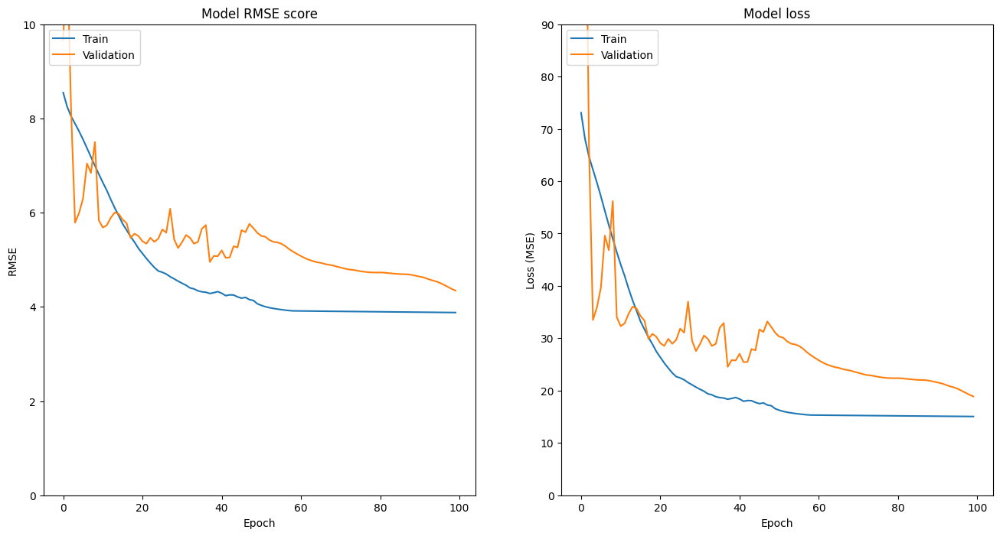

In [ ]:
# Plot training graphs

import matplotlib.pyplot as plt

# Plot both root_mean_squared_error and loss in the same figure
plt.figure(figsize=(16, 8))

# Plot root_mean_squared_error
plt.subplot(121)
plt.plot(history.history['root_mean_squared_error'])
plt.plot(history.history['val_root_mean_squared_error'])  # Add validation RMSE
plt.title('Model RMSE score')
plt.ylabel('RMSE')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.ylim(0, 10)  # Set y-axis limit to 70

# Plot loss (MSE)
plt.subplot(122)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])  # Add validation loss
plt.title('Model loss')
plt.ylabel('Loss (MSE)')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.ylim(0, 90)  # Set y-axis limit to 70

plt.show()

In [ ]:
prediction3 = model.predict(test_loader)

2/2 [==============================] - 4s 966ms/step


In [ ]:
# Model evaluation of angle -20:
# Calculate the different RMSE
from sklearn.metrics import mean_squared_error

# Calculate RMSE
rmse_value_0 = np.sqrt(mean_squared_error(test_set[0][1][0], prediction3[0][0]))
rmse_value_1 = np.sqrt(mean_squared_error(test_set[0][1][1], prediction3[0][1]))
rmse_value_2 = np.sqrt(mean_squared_error(test_set[0][1][2], prediction3[0][2]))
print(f"""RMSE_0: {rmse_value_0:.4f},
RMSE_1: {rmse_value_1:.4f},
RMSE_2: {rmse_value_2:.4f}
""")

RMSE_0: 4.6964,
RMSE_1: 1.3266,
RMSE_2: 7.6356



In [ ]:
# Model evaluation of angle 20:
# Calculate the different RMSE
from sklearn.metrics import mean_squared_error

# Calculate RMSE
rmse_value_0 = np.sqrt(mean_squared_error(test_set[1][1][0], prediction3[1][0]))
rmse_value_1 = np.sqrt(mean_squared_error(test_set[1][1][1], prediction3[1][1]))
rmse_value_2 = np.sqrt(mean_squared_error(test_set[1][1][2], prediction3[1][2]))
print(f"""RMSE_0: {rmse_value_0:.4f},
RMSE_1: {rmse_value_1:.4f},
RMSE_2: {rmse_value_2:.4f}
""")

RMSE_0: 4.5525,
RMSE_1: 1.0790,
RMSE_2: 3.0431



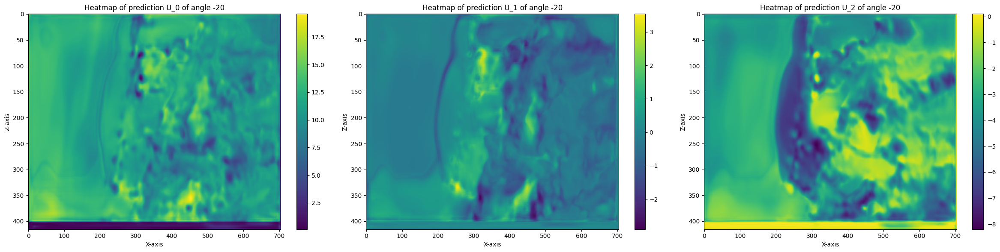

In [ ]:
import matplotlib.pyplot as plt

# Assuming prediction1 is a 3D array, where the second index varies from 0 to 2
# For example: prediction1 = np.random.rand(3, 10, 10)

fig, axes = plt.subplots(1, 3, figsize=(24, 6))  # Create a figure with 3 subplots

for i in range(3):
    plot_values = prediction3[0][i] # Adjust this according to your data structure
    ax = axes[i]
    im = ax.imshow(plot_values, cmap='viridis', aspect='auto')  # Choose a colormap (e.g., 'viridis')
    ax.set_title(f'Heatmap of prediction U_{i} of angle -20')
    ax.set_xlabel('X-axis')
    ax.set_ylabel('Z-axis')
    fig.colorbar(im, ax=ax)  # Add a colorbar to each subplot

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()

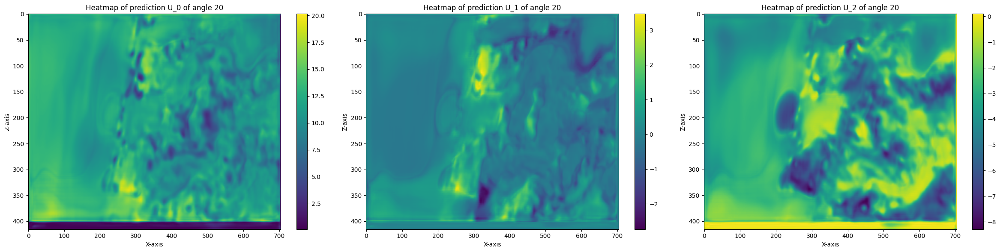

In [ ]:
import matplotlib.pyplot as plt

# Assuming prediction1 is a 3D array, where the second index varies from 0 to 2
# For example: prediction1 = np.random.rand(3, 10, 10)

fig, axes = plt.subplots(1, 3, figsize=(24, 6))  # Create a figure with 3 subplots

for i in range(3):
    plot_values = prediction3[1][i]  # Adjust this according to your data structure
    ax = axes[i]
    im = ax.imshow(plot_values, cmap='viridis', aspect='auto')  # Choose a colormap (e.g., 'viridis')
    ax.set_title(f'Heatmap of prediction U_{i} of angle 20')
    ax.set_xlabel('X-axis')
    ax.set_ylabel('Z-axis')
    fig.colorbar(im, ax=ax)  # Add a colorbar to each subplot

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()

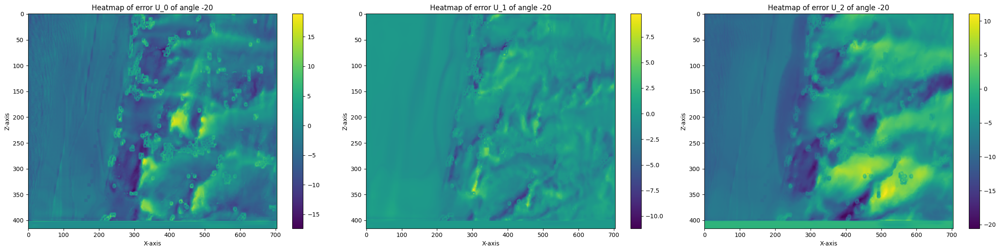

In [ ]:
import matplotlib.pyplot as plt

# Assuming prediction1 is a 3D array, where the second index varies from 0 to 2
# For example: prediction1 = np.random.rand(3, 10, 10)

fig, axes = plt.subplots(1, 3, figsize=(24, 6))  # Create a figure with 3 subplots

for i in range(3):
    plot_values = prediction3[0][i] - test_set[0][1][i] # Adjust this according to your data structure
    ax = axes[i]
    im = ax.imshow(plot_values, cmap='viridis', aspect='auto')  # Choose a colormap (e.g., 'viridis')
    ax.set_title(f'Heatmap of error U_{i} of angle -20')
    ax.set_xlabel('X-axis')
    ax.set_ylabel('Z-axis')
    fig.colorbar(im, ax=ax)  # Add a colorbar to each subplot

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()

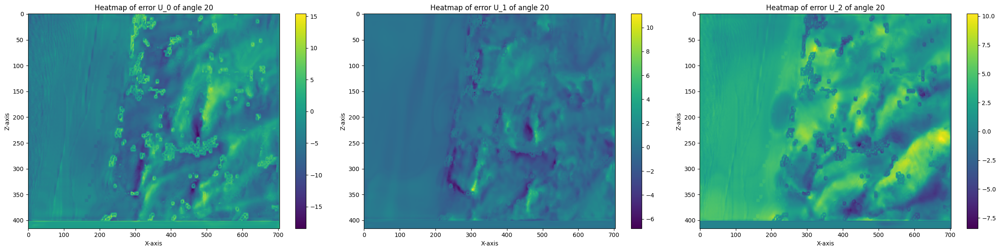

In [ ]:
import matplotlib.pyplot as plt

# Assuming prediction1 is a 3D array, where the second index varies from 0 to 2
# For example: prediction1 = np.random.rand(3, 10, 10)

fig, axes = plt.subplots(1, 3, figsize=(24, 6))  # Create a figure with 3 subplots

for i in range(3):
    plot_values = prediction3[1][i] - test_set[1][1][i] # Adjust this according to your data structure
    ax = axes[i]
    im = ax.imshow(plot_values, cmap='viridis', aspect='auto')  # Choose a colormap (e.g., 'viridis')
    ax.set_title(f'Heatmap of error U_{i} of angle 20')
    ax.set_xlabel('X-axis')
    ax.set_ylabel('Z-axis')
    fig.colorbar(im, ax=ax)  # Add a colorbar to each subplot

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()

# Now only the 3D input channels
no encoder freezing

In [ ]:
!pip install segmentation_models
!pip install keras_applications==1.0.7
!pip install efficientnet==1.0.0

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.7/50.7 kB 3.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 51.8/51.8 kB 630.3 kB/s eta 0:00:00
  Attempting uninstall: keras_applications
    Found existing installation: Keras-Applications 1.0.8
    Uninstalling Keras-Applications-1.0.8:
      Successfully uninstalled Keras-Applications-1.0.8


In [ ]:

# change SM framework to tensorflow keras
import os
os.environ["SM_FRAMEWORK"] = "tf.keras"

from tensorflow import keras
import segmentation_models as sm

# Set channels first, since the channels are the first dimension ( (2, 416, 704) for input, and (3, 416, 704) for output)
keras.backend.set_image_data_format('channels_first')

Segmentation Models: using `tf.keras` framework.


In [ ]:

# Import libraries
from segmentation_models import Unet
from segmentation_models import get_preprocessing
from segmentation_models.losses import bce_jaccard_loss
from segmentation_models.metrics import iou_score
import keras
# Define some loss and metric for training. Just picked two random one that don't neccecarily make sense.
# Did this just to check if the package is generic for the different losses and metrics.
metric = keras.metrics.RootMeanSquaredError()
loss = keras.losses.MeanSquaredError()

In [ ]:

from keras.layers import Input, Conv2D
from keras.models import Model
N = 2 # number of inputs

backbone = 'resnet152'
base_model = Unet(backbone_name=backbone, encoder_weights='imagenet', input_shape=(3, None, None), classes = 3, activation = 'linear')
#base_model = Unet(backbone_name='resnet34', encoder_weights='imagenet')

inp = Input(shape=(N, None, None))
l1 = Conv2D(3, (1, 1))(inp) # map N channels data to 3 channels
out = base_model(l1)

model = Model(inp, out, name=base_model.name)

234326024/234326024 [==============================] - 3s 0us/step


In [ ]:
# Compile the model with the different loss(es) and metric(s)
model.compile('Adam', loss=loss, metrics=[metric])

# define preprossesor
preprocess_input = get_preprocessing(backbone)

In [ ]:
# define the adjusted dataloader class
import torch
from torch.utils.data import Dataset
from torchvision import datasets
from torchvision.transforms import ToTensor
import matplotlib.pyplot as plt

import numpy as np
import os
import pandas as pd
from torchvision.io import read_image

from sklearn.preprocessing import MinMaxScaler


class CustomImageDataset(Dataset):
    def __init__(self, label_dir, img_dir, annotation_dir, transform=None, target_transform=None):
        self.label_dir = label_dir
        self.annotations = pd.read_csv(annotation_dir, delimiter = ';') # to dir
        self.img_dir = img_dir
        self.transform = transform
        self.target_transform = target_transform
        self.target_shape = (416, 704)
    def __len__(self):
        return len(os.listdir(self.label_dir))
        #return len(self.img_labels)

    def __getitem__(self, idx):
        #img_path = self.img_dir #os.path.join(self.img_dir, self.annotations.iloc[idx, 0])

        # input data
        input_path = os.path.join(self.img_dir, self.annotations.iloc[idx, 0])
        input = pd.read_csv(input_path)
        image = preprocess_input(input.Y)
        image = pd.DataFrame(image.values.reshape(401, 701))
        image = np.pad(image, ((0, 15), (0, 3)), mode='constant')
        #wind_inlet = pd.read_csv(input.inlet_wind_normal_surf_diff)
        wind_inlet = preprocess_input(input.inlet_wind_normal_surf_diff)
        wind_inlet = pd.DataFrame(wind_inlet.values.reshape(401, 701))
        wind_inlet = np.pad(wind_inlet, ((0, 15), (0, 3)), mode='constant')
        input_data = np.stack((image, wind_inlet))

        # output data
        label_path = os.path.join(self.label_dir, self.annotations.iloc[idx, 1]) # Maak csv met alle namen van bestanden (X en Y)
        label = pd.read_csv(label_path) #self.img_labels.iloc[idx, 1] # to di

        U_0 = label.loc[:, "U_0"]
        #U_0 = preprocess_input(U_0)
        U_1 = label.loc[:, "U_1"]
        #U_1 = preprocess_input(U_1)
        U_2 = label.loc[:, "U_2"]
        #U_2 = preprocess_input(U_2)

        U_0 = pd.DataFrame(U_0.values.reshape(401, 701))
        U_1 = pd.DataFrame(U_1.values.reshape(401, 701))
        U_2 = pd.DataFrame(U_2.values.reshape(401, 701))

        U_0 = np.pad(U_0, ((0, 15), (0, 3)), mode='constant')
        U_1 = np.pad(U_1, ((0, 15), (0, 3)), mode='constant')
        U_2 = np.pad(U_2, ((0, 15), (0, 3)), mode='constant')

        output_data = np.stack((U_0, U_1, U_2))

        return input_data, output_data #image, label

In [ ]:
# Save the callbacks, to later on save the model with best weights.
# Minumizing the loss so mode  = min
callbacks = [
    keras.callbacks.ModelCheckpoint('./best_model.h5', save_weights_only=True, save_best_only=True, mode='min'),
    keras.callbacks.ReduceLROnPlateau(),
]

In [ ]:
# make the custom dataset
train_label_dir = '/content/drive/MyDrive/Thesis /data 210524/Try data/train Y data'
test_label_dir = '/content/drive/MyDrive/Thesis /data 210524/Try data/test Y data'

train_img_dir = '/content/drive/MyDrive/Thesis /data 210524/Try data/train X data'
test_img_dir = '/content/drive/MyDrive/Thesis /data 210524/Try data/test X data'

train_annotation_dir = '/content/drive/MyDrive/Thesis /data 210524/Try data/Annotations train.csv'
test_annotation_dir = '/content/drive/MyDrive/Thesis /data 210524/Try data/Annotations test.csv'

train_set = CustomImageDataset(train_label_dir, train_img_dir, train_annotation_dir)
test_set = CustomImageDataset(test_label_dir, test_img_dir, test_annotation_dir)

In [ ]:
from torch.utils.data import DataLoader
class Dataloder(keras.utils.Sequence):
    """Load data from dataset and form batches

    Args:
        dataset: instance of Dataset class for image loading and preprocessing.
        batch_size: Integet number of images in batch.
        shuffle: Boolean, if `True` shuffle image indexes each epoch.
    """

    def __init__(self, dataset, batch_size=1, shuffle=False):
        self.dataset = dataset
        self.batch_size = batch_size
        self.shuffle = shuffle
        self.indexes = np.arange(len(dataset))

        self.on_epoch_end()

    def __getitem__(self, i):

        # collect batch data
        start = i * self.batch_size
        stop = (i + 1) * self.batch_size
        data = []
        for j in range(start, stop):
            data.append(self.dataset[j])

        # transpose list of lists
        batch = [np.stack(samples, axis=0) for samples in zip(*data)]

        return batch

    def __len__(self):
        """Denotes the number of batches per epoch"""
        return len(self.indexes) // self.batch_size

    def on_epoch_end(self):
        """Callback function to shuffle indexes each epoch"""
        if self.shuffle:
            self.indexes = np.random.permutation(self.indexes)

In [ ]:
train_loader = Dataloder(dataset = train_set, batch_size = 2, shuffle=True)
test_loader = Dataloder(dataset = test_set)

In [ ]:
history = model.fit_generator(
    train_loader,
    steps_per_epoch=len(train_loader),
    epochs=150,
    callbacks=callbacks,
    validation_data=test_loader,
    validation_steps=len(test_loader)
)

<ipython-input-10-aeb128f51c23>:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(


Epoch 1/150
5/5 [==============================] - 120s 3s/step - loss: 73.6740 - root_mean_squared_error: 8.5834 - val_loss: 25626.3359 - val_root_mean_squared_error: 160.0823 - lr: 0.0010
Epoch 2/150
5/5 [==============================] - 11s 2s/step - loss: 69.1406 - root_mean_squared_error: 8.3151 - val_loss: 24803545088.0000 - val_root_mean_squared_error: 157491.4062 - lr: 0.0010
Epoch 3/150
5/5 [==============================] - 10s 2s/step - loss: 65.7524 - root_mean_squared_error: 8.1088 - val_loss: 667733983232.0000 - val_root_mean_squared_error: 817149.9375 - lr: 0.0010
Epoch 4/150
5/5 [==============================] - 10s 2s/step - loss: 63.1979 - root_mean_squared_error: 7.9497 - val_loss: 328655405056.0000 - val_root_mean_squared_error: 573284.7500 - lr: 0.0010
Epoch 5/150
5/5 [==============================] - 11s 2s/step - loss: 60.6435 - root_mean_squared_error: 7.7874 - val_loss: 105536454656.0000 - val_root_mean_squared_error: 324863.7500 - lr: 0.0010
Epoch 6/150
5/5

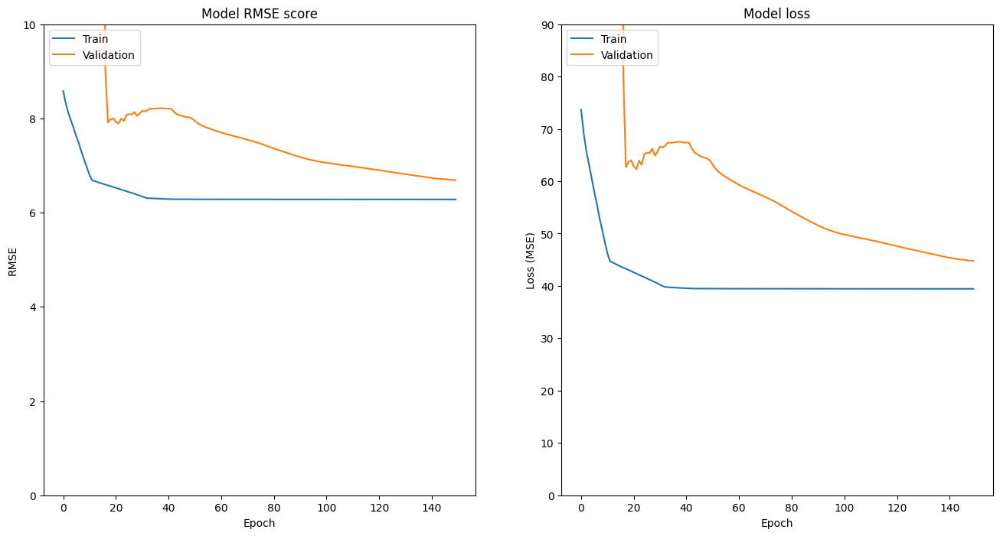

In [ ]:
# Plot training graphs

import matplotlib.pyplot as plt

# Plot both root_mean_squared_error and loss in the same figure
plt.figure(figsize=(16, 8))

# Plot root_mean_squared_error
plt.subplot(121)
plt.plot(history.history['root_mean_squared_error'])
plt.plot(history.history['val_root_mean_squared_error'])  # Add validation RMSE
plt.title('Model RMSE score')
plt.ylabel('RMSE')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.ylim(0, 10)  # Set y-axis limit to 70

# Plot loss (MSE)
plt.subplot(122)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])  # Add validation loss
plt.title('Model loss')
plt.ylabel('Loss (MSE)')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.ylim(0, 90)  # Set y-axis limit to 70

plt.show()

In [ ]:
prediction2 = model.predict(test_loader)

2/2 [==============================] - 6s 1s/step


In [ ]:
# Model evaluation of angle -20:
# Calculate the different RMSE
from sklearn.metrics import mean_squared_error

# Calculate RMSE
rmse_value_0 = np.sqrt(mean_squared_error(test_set[0][1][0], prediction2[0][0]))
rmse_value_1 = np.sqrt(mean_squared_error(test_set[0][1][1], prediction2[0][1]))
rmse_value_2 = np.sqrt(mean_squared_error(test_set[0][1][2], prediction2[0][2]))
print(f"""RMSE_0: {rmse_value_0:.4f},
RMSE_1: {rmse_value_1:.4f},
RMSE_2: {rmse_value_2:.4f}
""")

RMSE_0: 10.4545,
RMSE_1: 1.4272,
RMSE_2: 6.0308



In [ ]:
# Model evaluation of angle 20:
# Calculate the different RMSE
from sklearn.metrics import mean_squared_error

# Calculate RMSE
rmse_value_0 = np.sqrt(mean_squared_error(test_set[1][1][0], prediction2[1][0]))
rmse_value_1 = np.sqrt(mean_squared_error(test_set[1][1][1], prediction2[1][1]))
rmse_value_2 = np.sqrt(mean_squared_error(test_set[1][1][2], prediction2[1][2]))
print(f"""RMSE_0: {rmse_value_0:.4f},
RMSE_1: {rmse_value_1:.4f},
RMSE_2: {rmse_value_2:.4f}
""")

RMSE_0: 10.1534,
RMSE_1: 1.2185,
RMSE_2: 4.0334



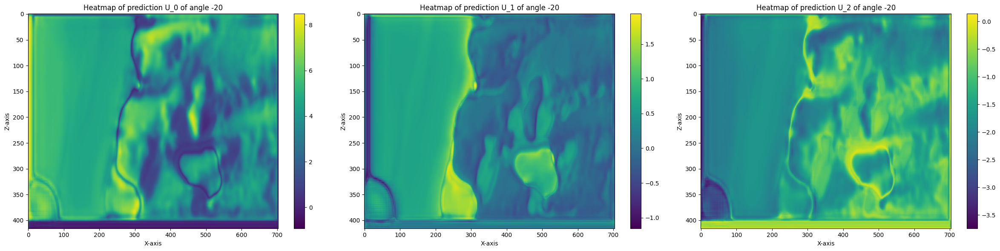

In [ ]:
import matplotlib.pyplot as plt

# Assuming prediction1 is a 3D array, where the second index varies from 0 to 2
# For example: prediction1 = np.random.rand(3, 10, 10)

fig, axes = plt.subplots(1, 3, figsize=(24, 6))  # Create a figure with 3 subplots

for i in range(3):
    plot_values = prediction2[0][i] # Adjust this according to your data structure
    ax = axes[i]
    im = ax.imshow(plot_values, cmap='viridis', aspect='auto')  # Choose a colormap (e.g., 'viridis')
    ax.set_title(f'Heatmap of prediction U_{i} of angle -20')
    ax.set_xlabel('X-axis')
    ax.set_ylabel('Z-axis')
    fig.colorbar(im, ax=ax)  # Add a colorbar to each subplot

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()

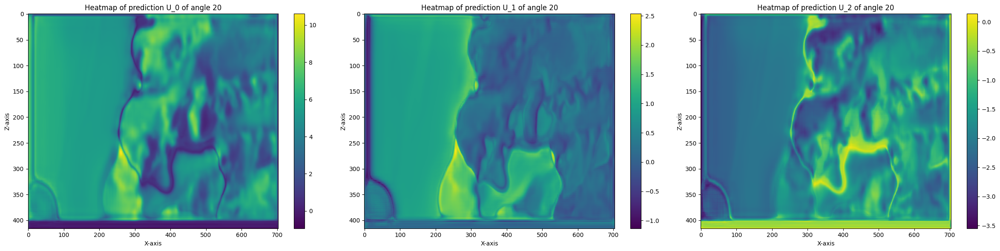

In [ ]:
import matplotlib.pyplot as plt

# Assuming prediction1 is a 3D array, where the second index varies from 0 to 2
# For example: prediction1 = np.random.rand(3, 10, 10)

fig, axes = plt.subplots(1, 3, figsize=(24, 6))  # Create a figure with 3 subplots

for i in range(3):
    plot_values = prediction2[1][i]  # Adjust this according to your data structure
    ax = axes[i]
    im = ax.imshow(plot_values, cmap='viridis', aspect='auto')  # Choose a colormap (e.g., 'viridis')
    ax.set_title(f'Heatmap of prediction U_{i} of angle 20')
    ax.set_xlabel('X-axis')
    ax.set_ylabel('Z-axis')
    fig.colorbar(im, ax=ax)  # Add a colorbar to each subplot

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()

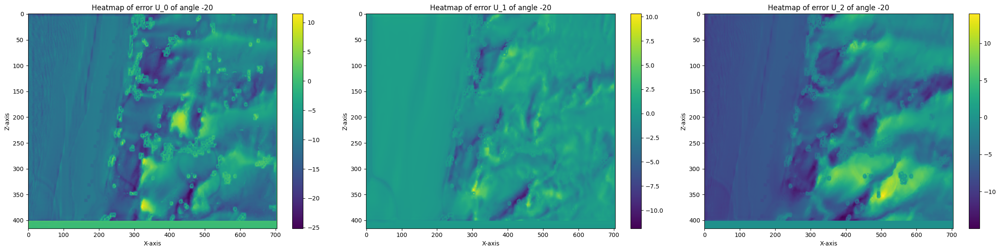

In [ ]:
import matplotlib.pyplot as plt

# Assuming prediction1 is a 3D array, where the second index varies from 0 to 2
# For example: prediction1 = np.random.rand(3, 10, 10)

fig, axes = plt.subplots(1, 3, figsize=(24, 6))  # Create a figure with 3 subplots

for i in range(3):
    plot_values = prediction2[0][i] - test_set[0][1][i] # Adjust this according to your data structure
    ax = axes[i]
    im = ax.imshow(plot_values, cmap='viridis', aspect='auto')  # Choose a colormap (e.g., 'viridis')
    ax.set_title(f'Heatmap of error U_{i} of angle -20')
    ax.set_xlabel('X-axis')
    ax.set_ylabel('Z-axis')
    fig.colorbar(im, ax=ax)  # Add a colorbar to each subplot

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()

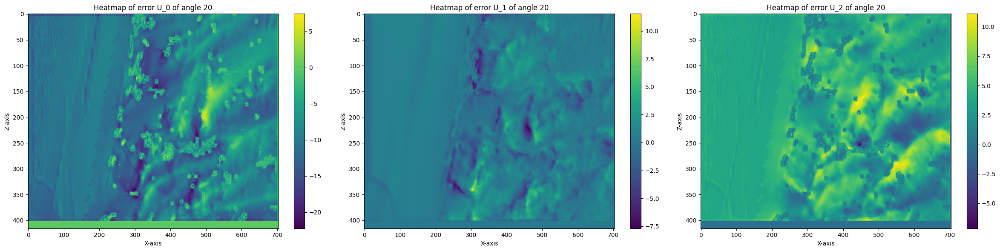

In [ ]:
import matplotlib.pyplot as plt

# Assuming prediction1 is a 3D array, where the second index varies from 0 to 2
# For example: prediction1 = np.random.rand(3, 10, 10)

fig, axes = plt.subplots(1, 3, figsize=(24, 6))  # Create a figure with 3 subplots

for i in range(3):
    plot_values = prediction2[1][i] - test_set[1][1][i] # Adjust this according to your data structure
    ax = axes[i]
    im = ax.imshow(plot_values, cmap='viridis', aspect='auto')  # Choose a colormap (e.g., 'viridis')
    ax.set_title(f'Heatmap of error U_{i} of angle 20')
    ax.set_xlabel('X-axis')
    ax.set_ylabel('Z-axis')
    fig.colorbar(im, ax=ax)  # Add a colorbar to each subplot

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()

# Now only the L1 and L2 loss function
no use of backbone and 3D input channels, train from scratch

In [ ]:
# Import libraries
from segmentation_models import Unet
from segmentation_models import get_preprocessing
from segmentation_models.losses import bce_jaccard_loss
from segmentation_models.metrics import iou_score
import keras
# Define some loss and metric for training. Just picked two random one that don't neccecarily make sense.
# Did this just to check if the package is generic for the different losses and metrics.
metric = keras.metrics.RootMeanSquaredError()
loss = keras.losses.MeanSquaredError()

In [ ]:
!pip install keras_cv

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 650.7/650.7 kB 6.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 950.8/950.8 kB 12.2 MB/s eta 0:00:00


In [ ]:
import keras_cv
loss = keras_cv.losses.SmoothL1Loss(l1_cutoff=1.0)#, **kwargs)

Using TensorFlow backend


In [ ]:
# Define the Unet model, for firs concept model I just picked the default backbone. Encoder weights to None since only 1 channel input.
# During the modelling I will test with conv layer as channel input to 3. (to utilize the weights)
backbone = 'resnet152'
model = Unet(backbone_name=backbone, encoder_weights=None, input_shape=(2, None, None), classes = 3, activation = 'linear')

# Compile the model with the different loss(es) and metric(s)
model.compile('Adam', loss=loss, metrics=[metric])

# define preprossesor
preprocess_input = get_preprocessing(backbone)

In [ ]:
# Save the callbacks, to later on save the model with best weights.
# Minumizing the loss so mode  = min
callbacks = [
    keras.callbacks.ModelCheckpoint('./best_model.h5', save_weights_only=True, save_best_only=True, mode='min'),
    keras.callbacks.ReduceLROnPlateau(),
]

In [ ]:
# make the custom dataset
train_label_dir = '/content/drive/MyDrive/Thesis /data 210524/Try data/train Y data'
test_label_dir = '/content/drive/MyDrive/Thesis /data 210524/Try data/test Y data'


train_img_dir = '/content/drive/MyDrive/Thesis /data 210524/Try data/train X data'
test_img_dir = '/content/drive/MyDrive/Thesis /data 210524/Try data/test X data'

train_annotation_dir = '/content/drive/MyDrive/Thesis /data 210524/Try data/Annotations train.csv'
test_annotation_dir = '/content/drive/MyDrive/Thesis /data 210524/Try data/Annotations test.csv'

train_set = CustomImageDataset(train_label_dir, train_img_dir, train_annotation_dir)
test_set = CustomImageDataset(test_label_dir, test_img_dir, test_annotation_dir)

In [ ]:
train_loader = Dataloder(dataset = train_set, batch_size = 2, shuffle=True)
test_loader = Dataloder(dataset = test_set)

In [ ]:
history = model.fit_generator(
    train_loader,
    steps_per_epoch=len(train_loader),
    epochs=50,
    callbacks=callbacks,
    validation_data=test_loader,
    validation_steps=len(test_loader)
)

<ipython-input-10-4e1034e28d42>:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(


Epoch 1/50
5/5 [==============================] - 116s 3s/step - loss: 5.9580 - root_mean_squared_error: 8.7400 - val_loss: 167642740555776.0000 - val_root_mean_squared_error: 185914705838080.0000 - lr: 0.0010
Epoch 2/50
5/5 [==============================] - 9s 2s/step - loss: 5.7472 - root_mean_squared_error: 8.5380 - val_loss: 4015829318369280.0000 - val_root_mean_squared_error: 4323327770361856.0000 - lr: 0.0010
Epoch 3/50
5/5 [==============================] - 11s 2s/step - loss: 5.6087 - root_mean_squared_error: 8.3675 - val_loss: 1245344021086208.0000 - val_root_mean_squared_error: 1418978945662976.0000 - lr: 0.0010
Epoch 4/50
5/5 [==============================] - 12s 3s/step - loss: 5.4814 - root_mean_squared_error: 8.2271 - val_loss: 71750180143104.0000 - val_root_mean_squared_error: 88417220165632.0000 - lr: 0.0010
Epoch 5/50
5/5 [==============================] - 13s 3s/step - loss: 5.3385 - root_mean_squared_error: 8.0436 - val_loss: 2757333352448.0000 - val_root_mean_squa

In [ ]:
prediction = model.predict(test_loader)

2/2 [==============================] - 4s 683ms/step


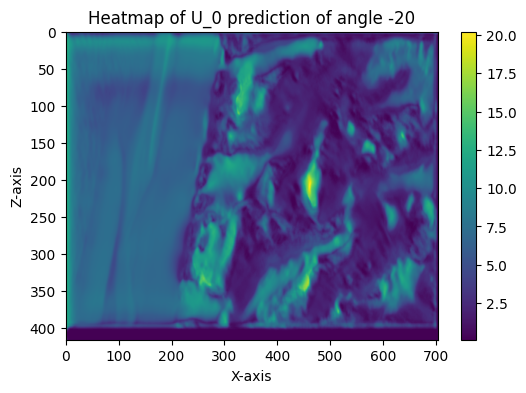

In [ ]:

plot_values = prediction[0][0]
# Plot the heatmap
plt.figure(figsize=(6, 4))  # Adjust the figure size as needed
plt.imshow(plot_values, cmap='viridis', aspect='auto')  # Choose a colormap (e.g., 'viridis')
plt.colorbar()  # Add a colorbar
plt.title('Heatmap of U_0 prediction of angle -20')
plt.xlabel('X-axis')
plt.ylabel('Z-axis')
plt.show()

In [ ]:

plot_values = prediction[0][0] - test_set[0][0][0]
# Plot the heatmap
plt.figure(figsize=(6, 4))  # Adjust the figure size as needed
plt.imshow(plot_values, cmap='viridis', aspect='auto')  # Choose a colormap (e.g., 'viridis')
plt.colorbar()  # Add a colorbar
plt.title('Heatmap of U_0 prediction of angle -20')
plt.xlabel('X-axis')
plt.ylabel('Z-axis')
plt.show()

In [ ]:
# Model evaluation after only the L1 loss:
# Calculate the different RMSE
from sklearn.metrics import mean_squared_error

# Calculate RMSE
rmse_value_0 = np.sqrt(mean_squared_error(test_set[0][1][0], prediction[0][0]))
rmse_value_1 = np.sqrt(mean_squared_error(test_set[0][1][1], prediction[0][1]))
rmse_value_2 = np.sqrt(mean_squared_error(test_set[0][1][2], prediction[0][2]))
print(f"""RMSE_0: {rmse_value_0:.4f},
RMSE_1: {rmse_value_1:.4f},
RMSE_2: {rmse_value_2:.4f}
""")

RMSE_0: 9.4551,
RMSE_1: 2.1437,
RMSE_2: 6.6916



In [ ]:
# now compile with l2 loss and fit again
# L2 loss:
loss = keras.losses.MeanSquaredError()

model.compile('Adam', loss=loss, metrics=[metric])

In [ ]:
history1 = model.fit_generator(
    train_loader,
    steps_per_epoch=len(train_loader),
    epochs=75,
    callbacks=callbacks,
    validation_data=test_loader,
    validation_steps=len(test_loader)
)

<ipython-input-12-2dab08806ece>:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history1 = model.fit_generator(


Epoch 1/75
5/5 [==============================] - 94s 2s/step - loss: 14.2349 - root_mean_squared_error: 4.1397 - val_loss: 1887.0586 - val_root_mean_squared_error: 43.4403 - lr: 0.0010
Epoch 2/75
5/5 [==============================] - 10s 2s/step - loss: 14.5763 - root_mean_squared_error: 3.8179 - val_loss: 461.4158 - val_root_mean_squared_error: 21.4806 - lr: 0.0010
Epoch 3/75
5/5 [==============================] - 11s 2s/step - loss: 13.4869 - root_mean_squared_error: 3.6725 - val_loss: 8153.8784 - val_root_mean_squared_error: 90.2988 - lr: 0.0010
Epoch 4/75
5/5 [==============================] - 10s 2s/step - loss: 12.8297 - root_mean_squared_error: 3.5819 - val_loss: 419790.9375 - val_root_mean_squared_error: 647.9127 - lr: 0.0010
Epoch 5/75
5/5 [==============================] - 10s 2s/step - loss: 12.3018 - root_mean_squared_error: 3.5074 - val_loss: 6463401.0000 - val_root_mean_squared_error: 2542.3220 - lr: 0.0010
Epoch 6/75
5/5 [==============================] - 11s 2s/step -

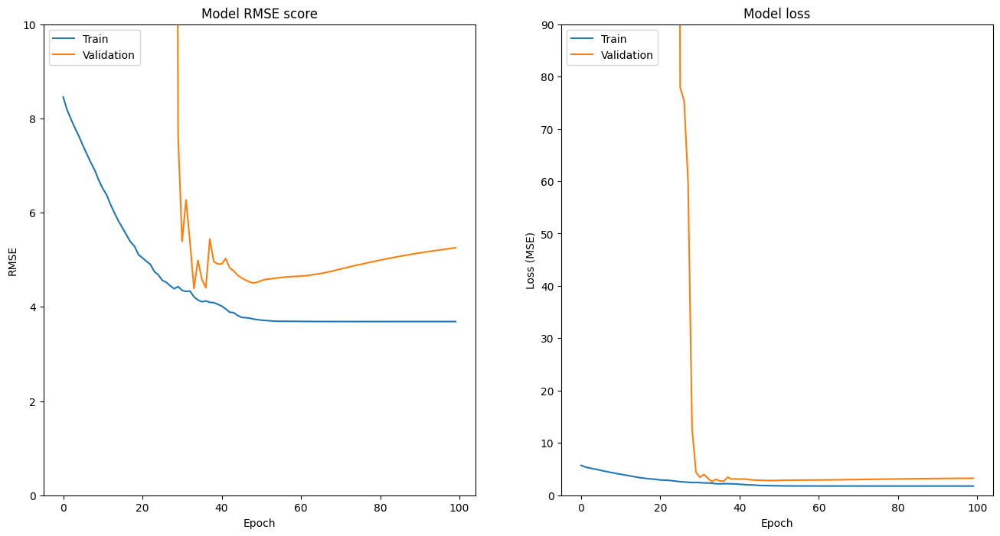

In [ ]:
# Plot training graphs

import matplotlib.pyplot as plt

# Plot both root_mean_squared_error and loss in the same figure
plt.figure(figsize=(16, 8))

# Plot root_mean_squared_error
plt.subplot(121)
plt.plot(history.history['root_mean_squared_error'])
plt.plot(history.history['val_root_mean_squared_error'])  # Add validation RMSE
plt.title('Model RMSE score')
plt.ylabel('RMSE')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.ylim(0, 10)  # Set y-axis limit to 70

# Plot loss (MSE)
plt.subplot(122)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])  # Add validation loss
plt.title('Model loss')
plt.ylabel('Loss (MSE)')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.ylim(0, 90)  # Set y-axis limit to 70

plt.show()

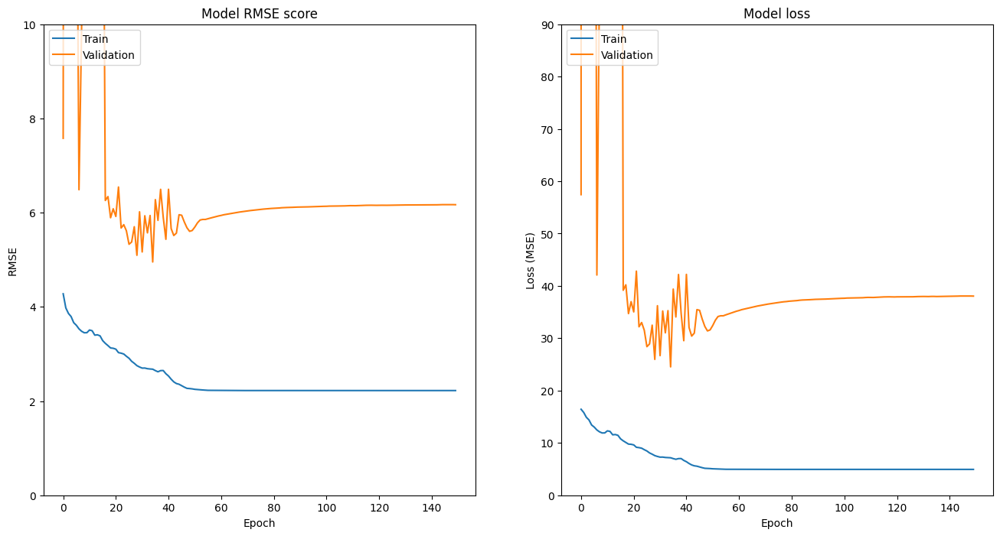

In [ ]:
# Plot training graphs

import matplotlib.pyplot as plt

# Plot both root_mean_squared_error and loss in the same figure
plt.figure(figsize=(16, 8))

# Plot root_mean_squared_error
plt.subplot(121)
plt.plot(history1.history['root_mean_squared_error'])
plt.plot(history1.history['val_root_mean_squared_error'])  # Add validation RMSE
plt.title('Model RMSE score')
plt.ylabel('RMSE')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.ylim(0, 10)  # Set y-axis limit to 70

# Plot loss (MSE)
plt.subplot(122)
plt.plot(history1.history['loss'])
plt.plot(history1.history['val_loss'])  # Add validation loss
plt.title('Model loss')
plt.ylabel('Loss (MSE)')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.ylim(0, 90)  # Set y-axis limit to 70

plt.show()

In [ ]:
prediction1 = model.predict(test_loader)

2/2 [==============================] - 6s 1s/step


In [ ]:
# Model evaluation of angle -20:
# Calculate the different RMSE
from sklearn.metrics import mean_squared_error

# Calculate RMSE
rmse_value_0 = np.sqrt(mean_squared_error(test_set[0][1][0], prediction1[0][0]))
rmse_value_1 = np.sqrt(mean_squared_error(test_set[0][1][1], prediction1[0][1]))
rmse_value_2 = np.sqrt(mean_squared_error(test_set[0][1][2], prediction1[0][2]))
print(f"""RMSE_0: {rmse_value_0:.4f},
RMSE_1: {rmse_value_1:.4f},
RMSE_2: {rmse_value_2:.4f}
""")

RMSE_0: 12.2404,
RMSE_1: 1.8351,
RMSE_2: 6.4497



In [ ]:
# Model evaluation of angle 20:
# Calculate the different RMSE
from sklearn.metrics import mean_squared_error

# Calculate RMSE
rmse_value_0 = np.sqrt(mean_squared_error(test_set[1][1][0], prediction1[1][0]))
rmse_value_1 = np.sqrt(mean_squared_error(test_set[1][1][1], prediction1[1][1]))
rmse_value_2 = np.sqrt(mean_squared_error(test_set[1][1][2], prediction1[1][2]))
print(f"""RMSE_0: {rmse_value_0:.4f},
RMSE_1: {rmse_value_1:.4f},
RMSE_2: {rmse_value_2:.4f}
""")

RMSE_0: 4.7445,
RMSE_1: 0.7660,
RMSE_2: 2.2334



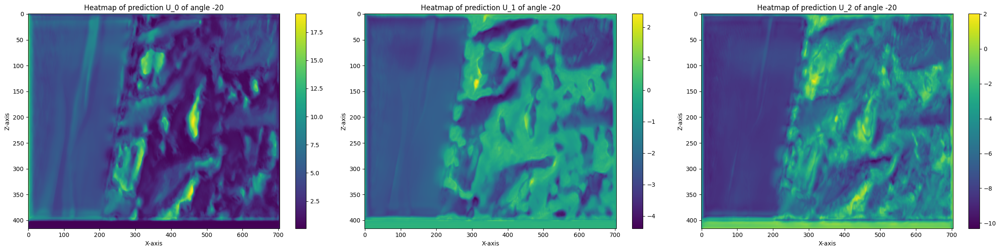

In [ ]:
import matplotlib.pyplot as plt

# Assuming prediction1 is a 3D array, where the second index varies from 0 to 2
# For example: prediction1 = np.random.rand(3, 10, 10)

fig, axes = plt.subplots(1, 3, figsize=(24, 6))  # Create a figure with 3 subplots

for i in range(3):
    plot_values = prediction1[0][i]  # Adjust this according to your data structure
    ax = axes[i]
    im = ax.imshow(plot_values, cmap='viridis', aspect='auto')  # Choose a colormap (e.g., 'viridis')
    ax.set_title(f'Heatmap of prediction U_{i} of angle -20')
    ax.set_xlabel('X-axis')
    ax.set_ylabel('Z-axis')
    fig.colorbar(im, ax=ax)  # Add a colorbar to each subplot

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()


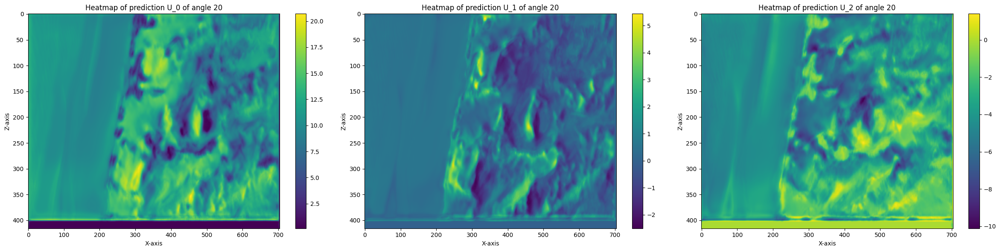

In [ ]:
import matplotlib.pyplot as plt

# Assuming prediction1 is a 3D array, where the second index varies from 0 to 2
# For example: prediction1 = np.random.rand(3, 10, 10)

fig, axes = plt.subplots(1, 3, figsize=(24, 6))  # Create a figure with 3 subplots

for i in range(3):
    plot_values = prediction1[1][i]  # Adjust this according to your data structure
    ax = axes[i]
    im = ax.imshow(plot_values, cmap='viridis', aspect='auto')  # Choose a colormap (e.g., 'viridis')
    ax.set_title(f'Heatmap of prediction U_{i} of angle 20')
    ax.set_xlabel('X-axis')
    ax.set_ylabel('Z-axis')
    fig.colorbar(im, ax=ax)  # Add a colorbar to each subplot

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()

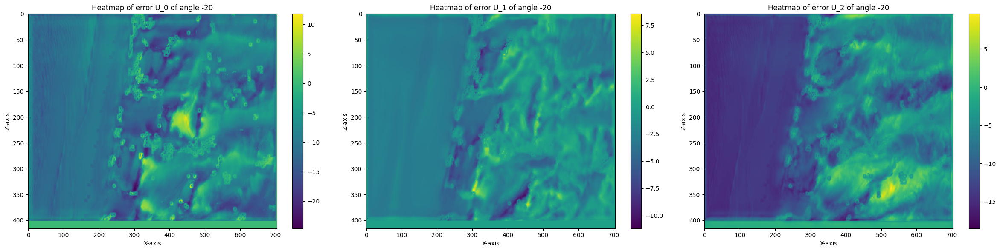

In [ ]:
import matplotlib.pyplot as plt

# Assuming prediction1 is a 3D array, where the second index varies from 0 to 2
# For example: prediction1 = np.random.rand(3, 10, 10)

fig, axes = plt.subplots(1, 3, figsize=(24, 6))  # Create a figure with 3 subplots

for i in range(3):
    plot_values = prediction1[0][i] - test_set[0][1][i] # Adjust this according to your data structure
    ax = axes[i]
    im = ax.imshow(plot_values, cmap='viridis', aspect='auto')  # Choose a colormap (e.g., 'viridis')
    ax.set_title(f'Heatmap of error U_{i} of angle -20')
    ax.set_xlabel('X-axis')
    ax.set_ylabel('Z-axis')
    fig.colorbar(im, ax=ax)  # Add a colorbar to each subplot

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()

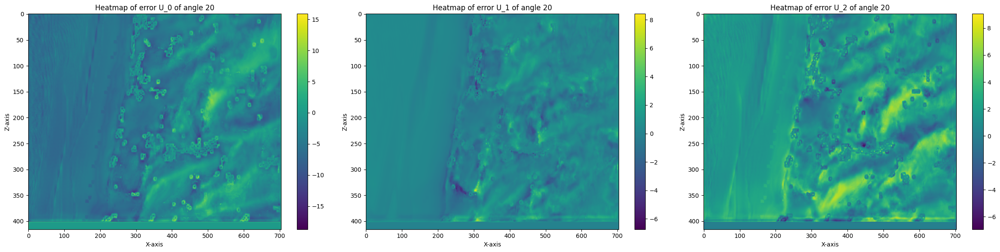

In [ ]:
import matplotlib.pyplot as plt

# Assuming prediction1 is a 3D array, where the second index varies from 0 to 2
# For example: prediction1 = np.random.rand(3, 10, 10)

fig, axes = plt.subplots(1, 3, figsize=(24, 6))  # Create a figure with 3 subplots

for i in range(3):
    plot_values = prediction1[1][i] - test_set[1][1][i] # Adjust this according to your data structure
    ax = axes[i]
    im = ax.imshow(plot_values, cmap='viridis', aspect='auto')  # Choose a colormap (e.g., 'viridis')
    ax.set_title(f'Heatmap of error U_{i} of angle 20')
    ax.set_xlabel('X-axis')
    ax.set_ylabel('Z-axis')
    fig.colorbar(im, ax=ax)  # Add a colorbar to each subplot

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()

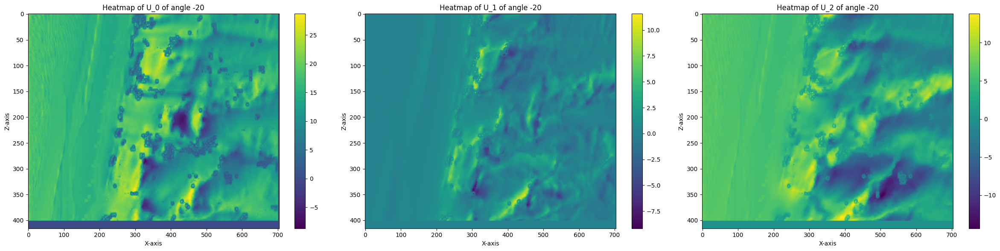

In [ ]:
import matplotlib.pyplot as plt

# Assuming prediction1 is a 3D array, where the second index varies from 0 to 2
# For example: prediction1 = np.random.rand(3, 10, 10)

fig, axes = plt.subplots(1, 3, figsize=(24, 6))  # Create a figure with 3 subplots

for i in range(3):
    plot_values = test_set[0][1][i] # Adjust this according to your data structure
    ax = axes[i]
    im = ax.imshow(plot_values, cmap='viridis', aspect='auto')  # Choose a colormap (e.g., 'viridis')
    ax.set_title(f'Heatmap of U_{i} of angle -20')
    ax.set_xlabel('X-axis')
    ax.set_ylabel('Z-axis')
    fig.colorbar(im, ax=ax)  # Add a colorbar to each subplot

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()

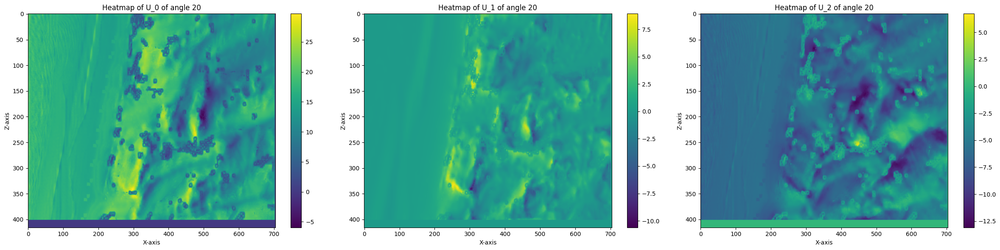

In [ ]:
import matplotlib.pyplot as plt

# Assuming prediction1 is a 3D array, where the second index varies from 0 to 2
# For example: prediction1 = np.random.rand(3, 10, 10)

fig, axes = plt.subplots(1, 3, figsize=(24, 6))  # Create a figure with 3 subplots

for i in range(3):
    plot_values = test_set[1][1][i] # Adjust this according to your data structure
    ax = axes[i]
    im = ax.imshow(plot_values, cmap='viridis', aspect='auto')  # Choose a colormap (e.g., 'viridis')
    ax.set_title(f'Heatmap of U_{i} of angle 20')
    ax.set_xlabel('X-axis')
    ax.set_ylabel('Z-axis')
    fig.colorbar(im, ax=ax)  # Add a colorbar to each subplot

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()